# Segmentation of neuronal structures in EM stacks

The ISBI 2012 challenge server has been decommissioned, but you can still download the training and test data! [Segmentation of neuronal structures in EM stacks](https://imagej.net/events/isbi-2012-segmentation-challenge)

## About the Challenge
In this challenge, a full stack of EM slices will be used to train machine learning algorithms for the purpose of automatic segmentation of neural structures.

The images are representative of actual images in the real-world, containing some noise and small image alignment errors. None of these problems led to any difficulties in the manual labeling of each element in the image stack by an expert human neuroanatomist. The aim of the challenge is to compare and rank the different competing methods based on their pixel and object classification accuracy.

## Training data
The training data is a set of 30 sections from a serial section Transmission Electron Microscopy (ssTEM) data set of the Drosophila first instar larva ventral nerve cord (VNC). The microcube measures 2 x 2 x 1.5 microns approx., with a resolution of 4x4x50 nm/pixel.

The corresponding binary labels are provided in an in-out fashion, i.e. white for the pixels of segmented objects and black for the rest of pixels (which correspond mostly to membranes).

## Test data

The contesting segmentation methods will be ranked by their performance on a test dataset, also available in the challenge server(offline), after registration. This test data is another volume from the same Drosophila first instar larva VNC as the training dataset.

## Result format

The results are expected to be uploaded in the challenge server(offline) as a 32-bit TIFF 3D image, which values between 0 (100% membrane certainty) and 1 (100% non-membrane certainty).

## Exploring the Dataset

In [1]:
import os

import numpy as np

import matplotlib.pyplot as plt

from PIL import Image, ImageSequence

## Loading the Dataset

In [2]:
train_volume = Image.open('./ISBI-2012-challenge/train-volume.tif')
train_labels = Image.open('./ISBI-2012-challenge/train-labels.tif')

test_volume = Image.open('./ISBI-2012-challenge/test-volume.tif')
test_labels = Image.open('./ISBI-2012-challenge/test-labels.tif')

train_volume = [image.copy() for image in ImageSequence.Iterator(train_volume)]
train_labels = [image.copy() for image in ImageSequence.Iterator(train_labels)]

test_volume = [image.copy() for image in ImageSequence.Iterator(test_volume)]
test_labels = [image.copy() for image in ImageSequence.Iterator(test_labels)]

print(f'Num training samples:   {len(train_volume)}')
print(f'Num testing samples:    {len(test_volume)}')
print(f'Shape samples:          {np.array(train_volume[0]).shape}')

Num training samples:   30
Num testing samples:    30
Shape samples:          (512, 512)


## Visualizing Training and Test Data

* 30 training samples

* 30 test samples

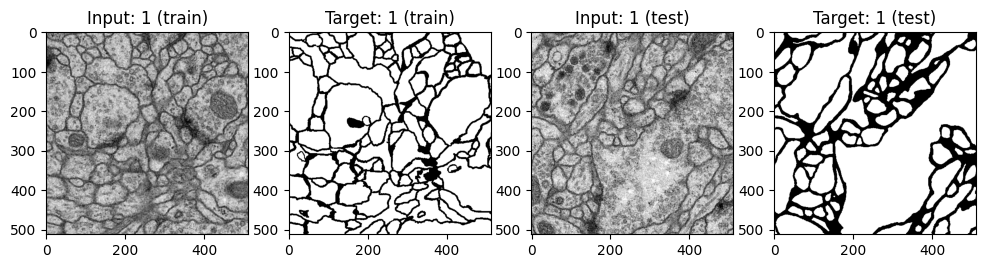

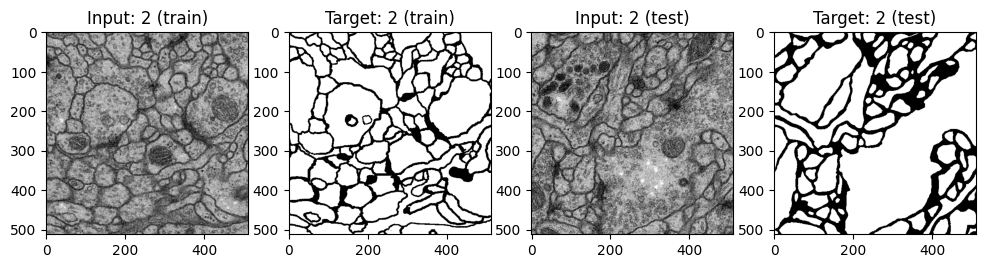

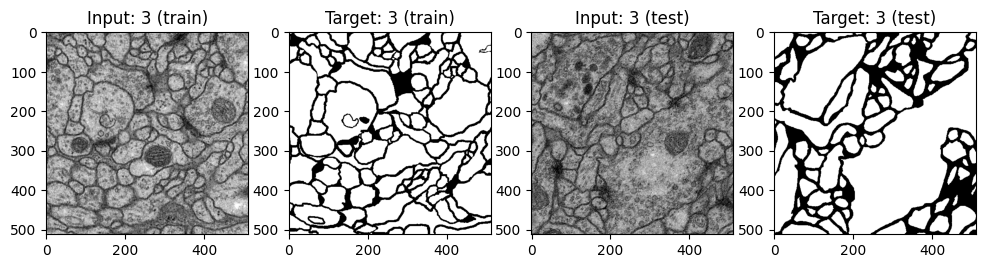

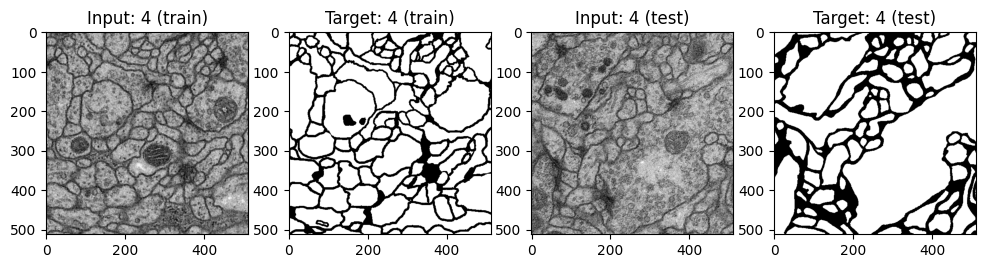

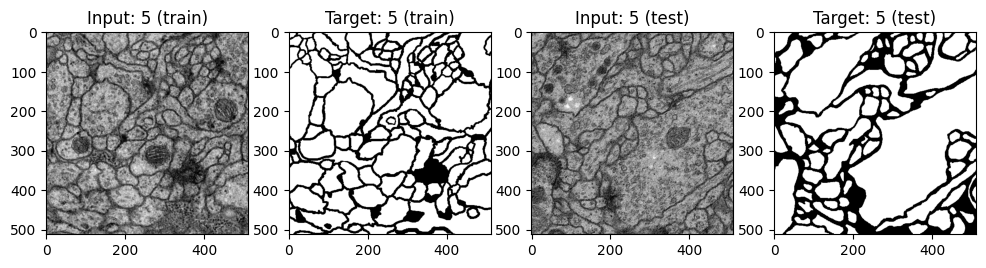

...

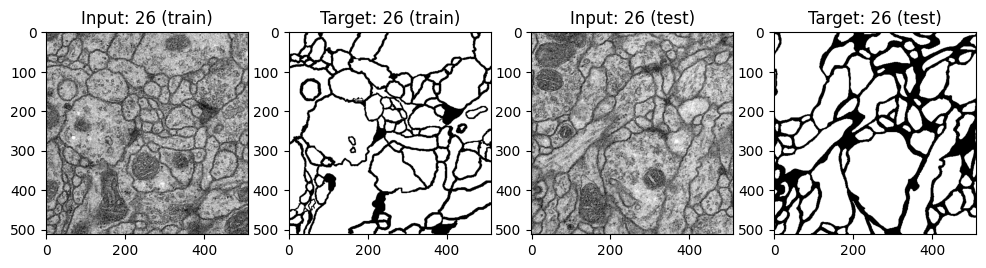

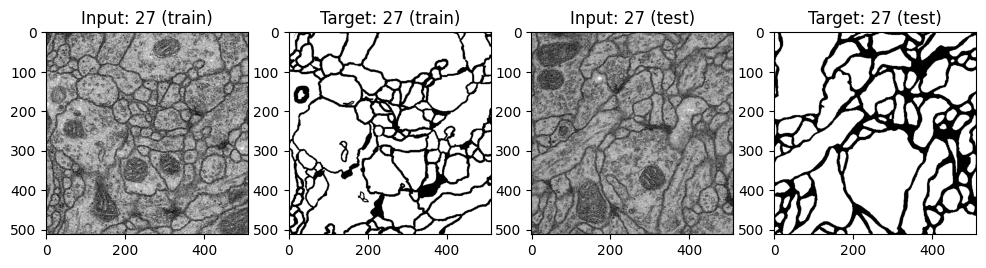

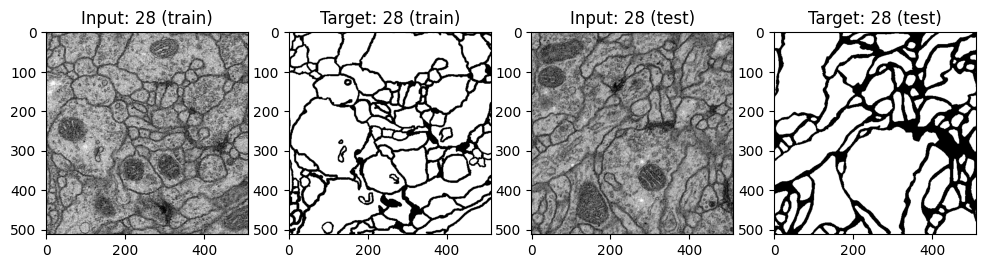

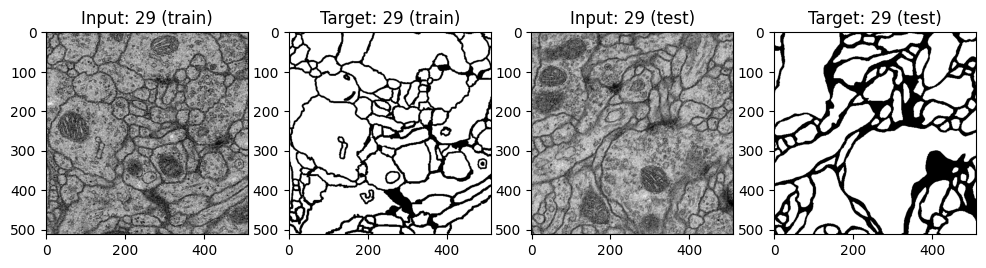

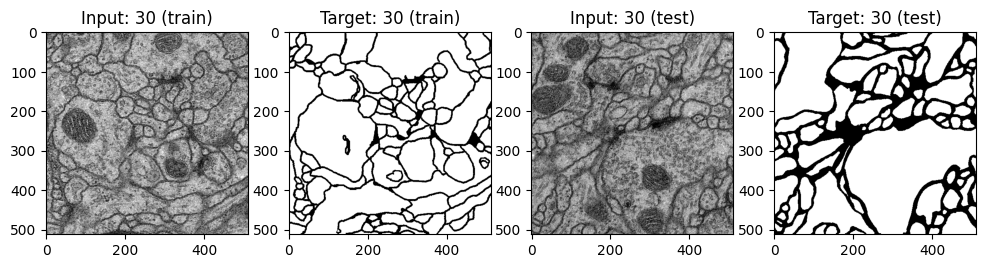

In [3]:
for i, (x_train, y_train, x_test, y_test) in enumerate(zip(train_volume, train_labels, test_volume, test_labels)):
    _, ax = plt.subplots(ncols=4, figsize=(12, 5))
    ax.flatten()

    # training data 
    ax[0].imshow(x_train, cmap='gray')
    ax[0].set_title(f'Input: {i + 1} (train)')
    ax[1].set_title(f'Target: {i + 1} (train)')
    ax[1].imshow(y_train, cmap='gray')

    # test data 
    ax[2].imshow(x_test, cmap='gray')
    ax[2].set_title(f'Input: {i + 1} (test)')
    ax[3].set_title(f'Target: {i + 1} (test)')
    ax[3].imshow(y_test, cmap='gray')

    plt.show()

In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset

import torchvision.transforms.functional as TF

from unet.dataset import NeuronalStructures, TrainTransform, TestTransform

In [5]:
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'mps')

In [6]:
train_transform = TrainTransform()
train_set = NeuronalStructures(transform=train_transform)
train_loader = DataLoader(train_set, batch_size=1, shuffle=True)

test_transform = TestTransform()
test_set = NeuronalStructures(transform=test_transform, features='test-volume.tif', labels='test-labels.tif')
test_loader = DataLoader(test_set, batch_size=1)

train_set_no_augmentation = NeuronalStructures(transform=test_transform)

In [7]:
from unet.unet import UNet

# -- Trainig Settings --
BATCH_SIZE = 1
EPOCHS = 5
LEARNING_RATE = 0.001
MOMENTUM = 0.99
INPUT_PADDING = 96
VERBOSE = True
PLOTTING = True

# --- Model, Optimizer and Criterion ---
unet = UNet(in_channels=1, out_channels=2).to(DEVICE)
optimizer = torch.optim.SGD(params=unet.parameters(),lr=LEARNING_RATE, momentum=MOMENTUM)
criterion = nn.CrossEntropyLoss()

# --- Plot settings ---
PLOTTING = True
PLOT_DIR = './imgs_pred'
FIGSIZE = (8, 4)
N_ROWS = 4

if not os.path.exists(PLOT_DIR):
    os.mkdir(PLOT_DIR)


DPI = 150
PANEL_PX = 384
FIGSIZE = (3 * PANEL_PX / DPI, N_ROWS * PANEL_PX / DPI)

def save_images(model: nn.Module, dataset: Dataset, epoch: int) -> None:
    model.eval()
    fig, ax = plt.subplots(
        nrows=N_ROWS, ncols=3, figsize=FIGSIZE, dpi=DPI, constrained_layout=True
    )
    titles = ["Image", "Ground truth", "Prediction"]
    for c in range(3):
        ax[0, c].set_title(titles[c])

    with torch.no_grad():
        for r in range(min(N_ROWS, len(dataset))):
            x, y = dataset[r]
            if x.ndim == 2: 
                x = x.unsqueeze(0)
            H, W = y.shape[-2], y.shape[-1]

            x_in = x.unsqueeze(0).to(DEVICE)        # [1,1,H,W]
            x_pad = F.pad(x_in, (INPUT_PADDING,)*4, mode="reflect")

            logits = model(x_pad)
            logits = F.interpolate(logits, size=(H, W), mode="bilinear", align_corners=False)
            y_hat = logits.softmax(1).argmax(1).squeeze(0).cpu().numpy()

            img_np = x.cpu().squeeze(0).numpy()
            y_np   = y.cpu().numpy() if torch.is_tensor(y) else y

            ax[r, 0].imshow(img_np, cmap="gray", interpolation="nearest")
            ax[r, 1].imshow(y_np,   cmap="gray", interpolation="nearest")
            ax[r, 2].imshow(y_hat,  cmap="gray", interpolation="nearest")
            for c in range(3):
                ax[r, c].axis("off")

    out = os.path.join(PLOT_DIR, f"pred_masks_{epoch}.png")
    fig.savefig(out, bbox_inches="tight")
    plt.close(fig)

In [8]:
losses = []
N_data = len(train_set)
for epoch in range(EPOCHS):
    total_loss = 0.0
    for x, y in train_loader:
        x, y = x.to(DEVICE), y.to(DEVICE) 
        x_pad = F.pad(x, 4 * (INPUT_PADDING,), mode='reflect')

        y_pred = unet(x_pad)
        _, _, H, W = x.shape
        y_pred = TF.center_crop(y_pred, output_size=(H, W))
        loss = criterion(y_pred, y)

        optimizer.zero_grad() 
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * x.size(0)

    losses.append(total_loss / N_data)
    if VERBOSE:
        print(f'epoch: {epoch}/{EPOCHS}\tloss: {total_loss / N_data}')

    if PLOTTING:
        save_images(unet, train_set_no_augmentation, epoch)


epoch: 0/5	loss: 0.42584490875403086
epoch: 1/5	loss: 0.09182924032211304
epoch: 2/5	loss: 0.022042285293961565
epoch: 3/5	loss: 0.042856839920083684
epoch: 4/5	loss: 0.07040554843842983


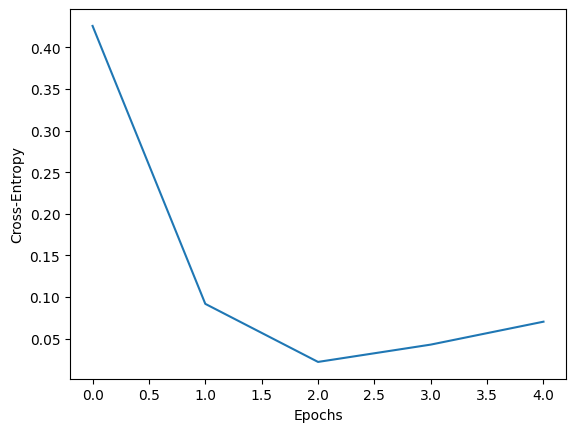

In [9]:
_, ax = plt.subplots()
ax.plot(np.arange(len(losses)), losses, label='Loss')
ax.set_xlabel('Epochs')
ax.set_ylabel('Cross-Entropy')
plt.show()

In [10]:
torch.save(unet.state_dict(), 'unet_trained.pth')
unet = UNet(1, 2)
unet.load_state_dict(torch.load('unet_trained.pth', weights_only=True))

<All keys matched successfully>